# Mount Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Import Libraries

In [2]:
import cv2
import numpy as np  
from matplotlib import pyplot as plt
%matplotlib inline

# Load image

(<matplotlib.image.AxesImage at 0x7f7c0a956290>,
 Text(0.5, 1.0, 'Original Image'),
 ([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

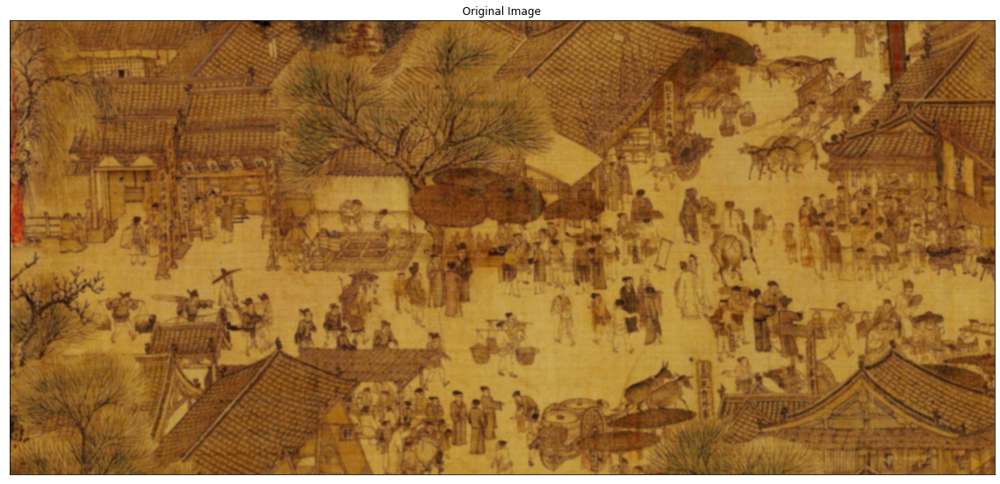

In [130]:
path = '/content/gdrive/My Drive/Computer Vision/'

img = cv2.imread(path+'Q1_qingming_shange_tu.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display image
plt.figure(figsize=(20, 20)) 
plt.imshow(img, cmap='gray'), plt.title('Original Image'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Histogram for Original Image'), (0.0, 256.0))

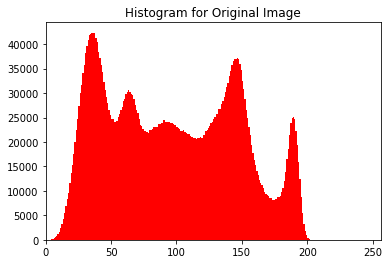

In [131]:
# display histogram
plt.hist(img.ravel(),256,[0,256],color = 'r') 
plt.title('Histogram for Original Image'), plt.xlim([0,256])

# Attempt I

### Sharpening Filter : Sharpen the edges

Text(0.5, 1.0, 'Sharpening Filter')

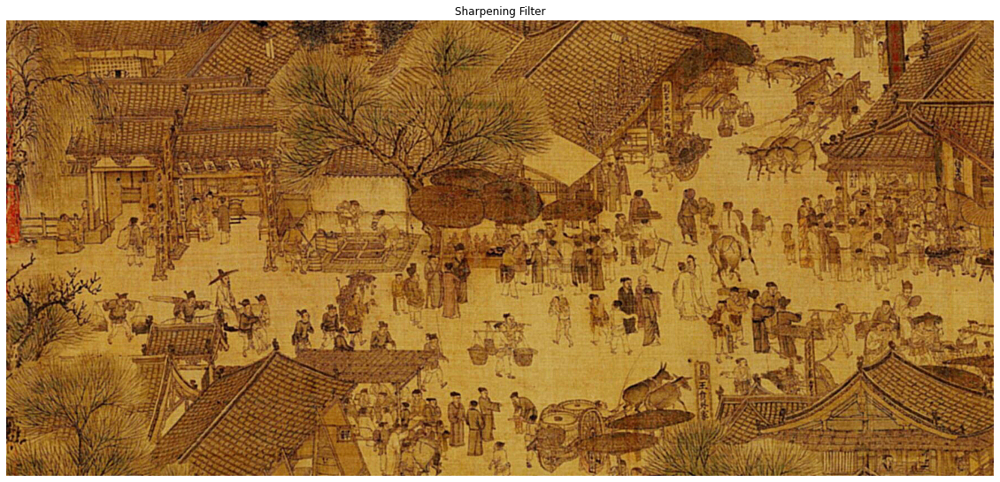

In [132]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
img_sharp = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=(20, 20))  
plt.imshow(img_sharp)
plt.axis('off')
plt.title('Sharpening Filter')

### Contrast Stretching : To make the image brighter

Text(0.5, 1.0, 'Constrast Stretching')

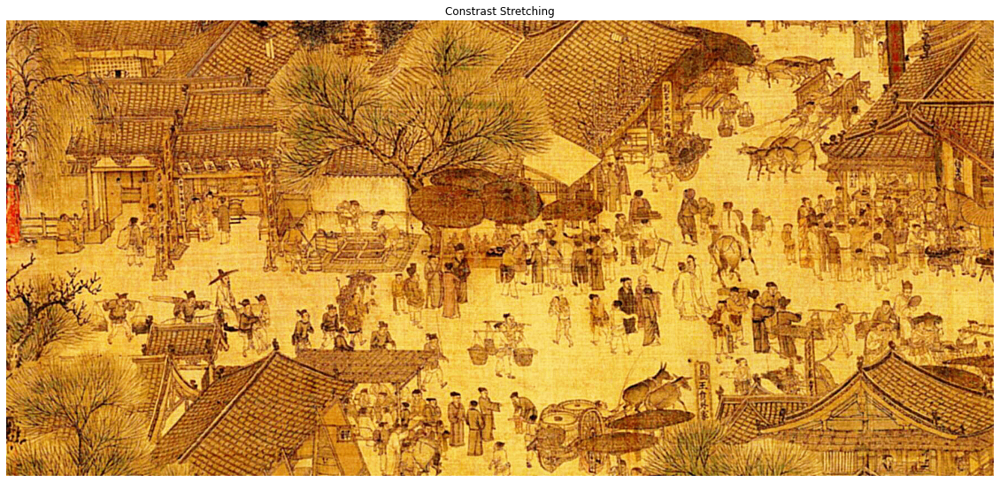

In [133]:
hist,bins = np.histogram(img_sharp.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_m = np.ma.masked_equal(cdf,0)
cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
cdf = np.ma.filled(cdf_m,0).astype('uint8')
img_cs = cdf[img_sharp]

plt.figure(figsize=(20, 20))  
plt.imshow(img_cs)
plt.axis('off')
plt.title('Constrast Stretching')

(Text(0.5, 1.0, 'Histogram for Constrast Stretching'), (0.0, 256.0))

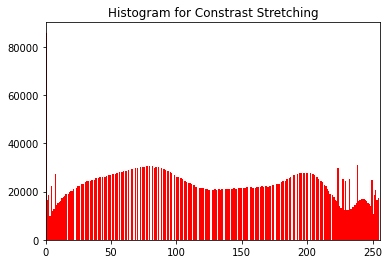

In [124]:
plt.hist(img_cs.ravel(),256,[0,256],color = 'r') 
plt.title('Histogram for Constrast Stretching'), plt.xlim([0,256])

### Bilateral Filter : Reduce noise while preserving edges

Text(0.5, 1.0, 'Bilateral Filter')

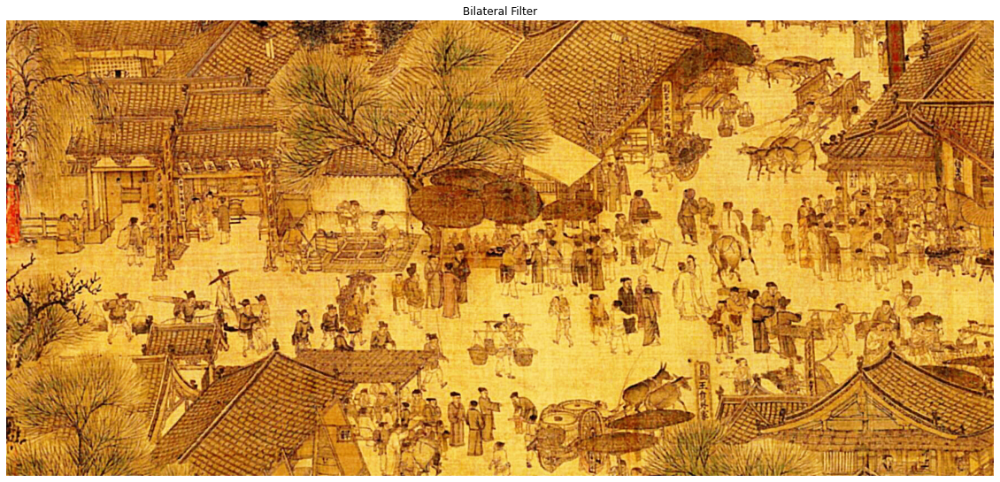

In [125]:
img_bi = cv2.bilateralFilter(img_cs, 1, 80, 80)

plt.figure(figsize=(20, 20))  
plt.imshow(img_bi)
plt.axis('off')
plt.title('Bilateral Filter')

# Attemp II : Mahotas

### Sharpening Filter : Sharpen the edges

Text(0.5, 1.0, 'Sharpening Filter')

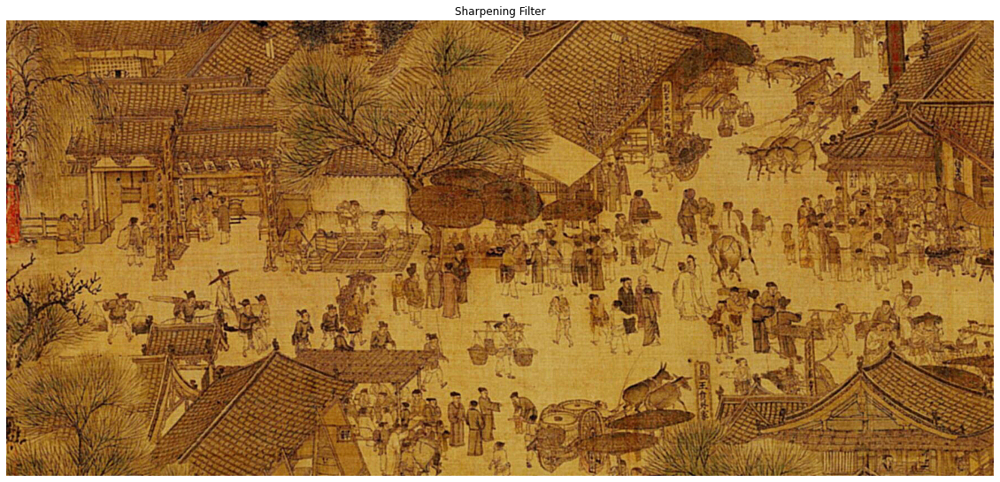

In [126]:
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
img_sharp = cv2.filter2D(img, -1, kernel)

plt.figure(figsize=(20, 20))  
plt.imshow(img_sharp)
plt.axis('off')
plt.title('Sharpening Filter')

### Contrast Stretching : To make the image brighter

In [81]:
!pip install mahotas

     |████████████████████████████████| 5.7 MB 9.0 MB/s 


Text(0.5, 1.0, 'Constrast Stretching')

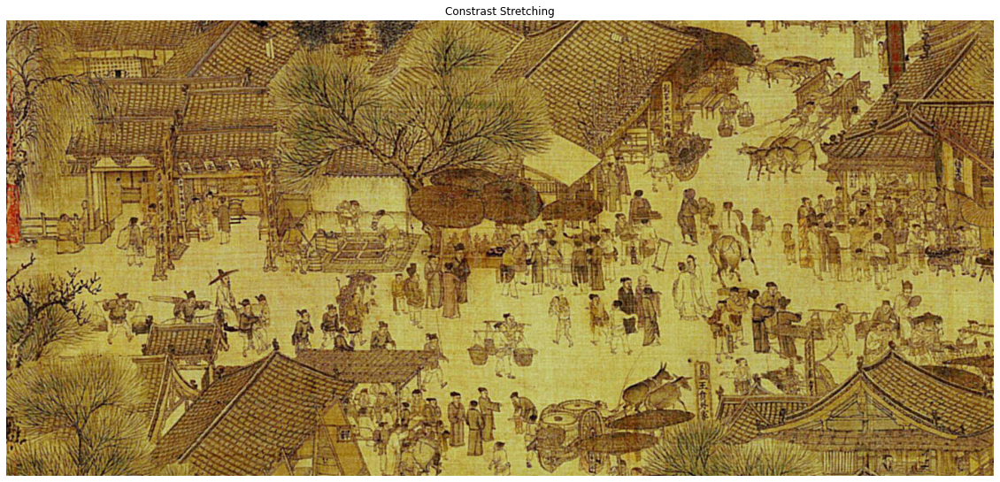

In [127]:
import mahotas

img_cs = mahotas.stretch_rgb(img_sharp)

plt.figure(figsize=(20, 20))  
plt.imshow(img_cs)
plt.axis('off')
plt.title('Constrast Stretching')

(Text(0.5, 1.0, 'Histogram for Processed Image'), (0.0, 256.0))

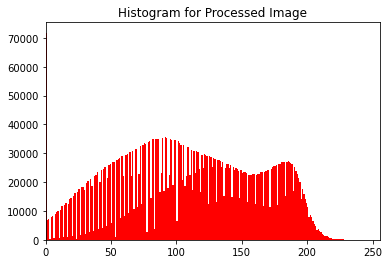

In [128]:
plt.hist(img_cs.ravel(),256,[0,256],color = 'r') 
plt.title('Histogram for Processed Image'), plt.xlim([0,256])

### Bilateral Filter : Reduce noise while preserving edges

Text(0.5, 1.0, 'Bilateral Filter')

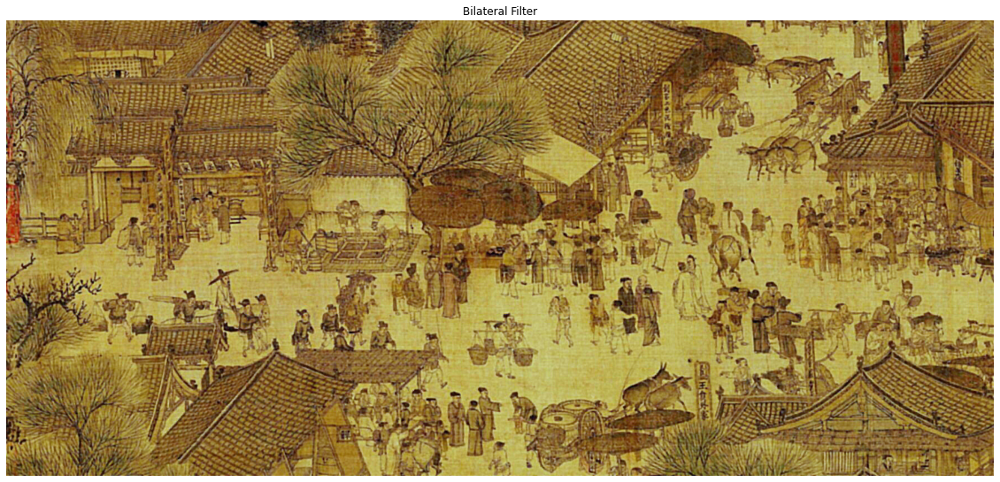

In [129]:
img_bi = cv2.bilateralFilter(img_cs, 1, 80, 80)

plt.figure(figsize=(20, 20))  
plt.imshow(img_bi)
plt.axis('off')
plt.title('Bilateral Filter')